In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

from test_image import *
from steerable_pyramid import SteerablePyramid, SuboctaveSP

%matplotlib inline

In [79]:
2.0**np.arange(-4, 0.5, 0.5)[::-1]

array([1.        , 0.70710678, 0.5       , 0.35355339, 0.25      ,
       0.1767767 , 0.125     , 0.08838835, 0.0625    ])

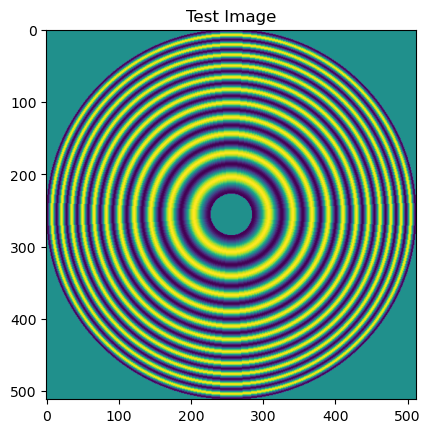

In [2]:
from skimage.data import camera

image = get_test_image(512, f1)
image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8UC1)

# image = camera()

plt.imshow(image)
plt.title("Test Image");

In [61]:
s_pyr = SteerablePyramid(depth=4, orientations=4, filters_per_octave=2, twidth=0.75, complex_pyr=True)
# s_pyr = SuboctaveSP(depth=7, orientations=8, filters_per_octave=4, cos_order=6, complex_pyr=True)

In [62]:
# get Steerable Pyramid Filters
# filters, crops = s_pyr.get_filters(image) # SubOctive class only
filters, crops = s_pyr.get_filters(image, cropped=True) # SubOctive class only

# get Steerable Pyramid Decomposition
pyramid = s_pyr.build_pyramid(image, filters, crops)

# reconstruct original image DFT from pyramid decomposition
recon_dft = s_pyr.reconstruct_image_dft(pyramid, filters, crops)

In [63]:
len(filters), s_pyr.depth, s_pyr.depth * s_pyr.orientations, s_pyr.num_filts

(34, 4, 16, 8)

## Display Results

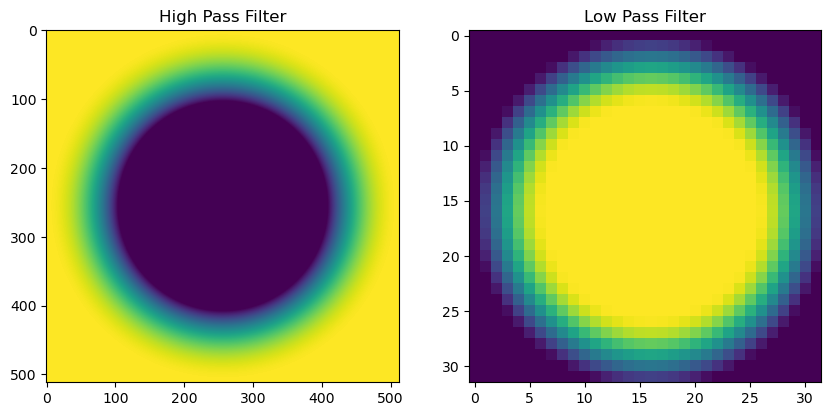

In [64]:
_, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(filters[0]);
ax[0].set_title("High Pass Filter");

ax[1].imshow(filters[-1]);
ax[1].set_title("Low Pass Filter");

### Visualize the Transition Regiond of the HPF

Text(0.5, 1.0, 'Cross Section of the HPF')

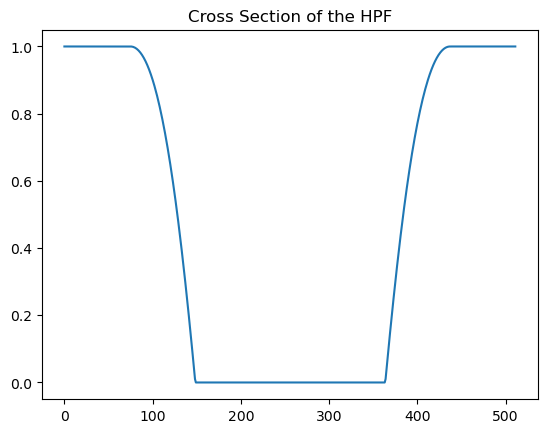

In [65]:
plt.plot(np.diag(filters[0]));
plt.title("Cross Section of the HPF")

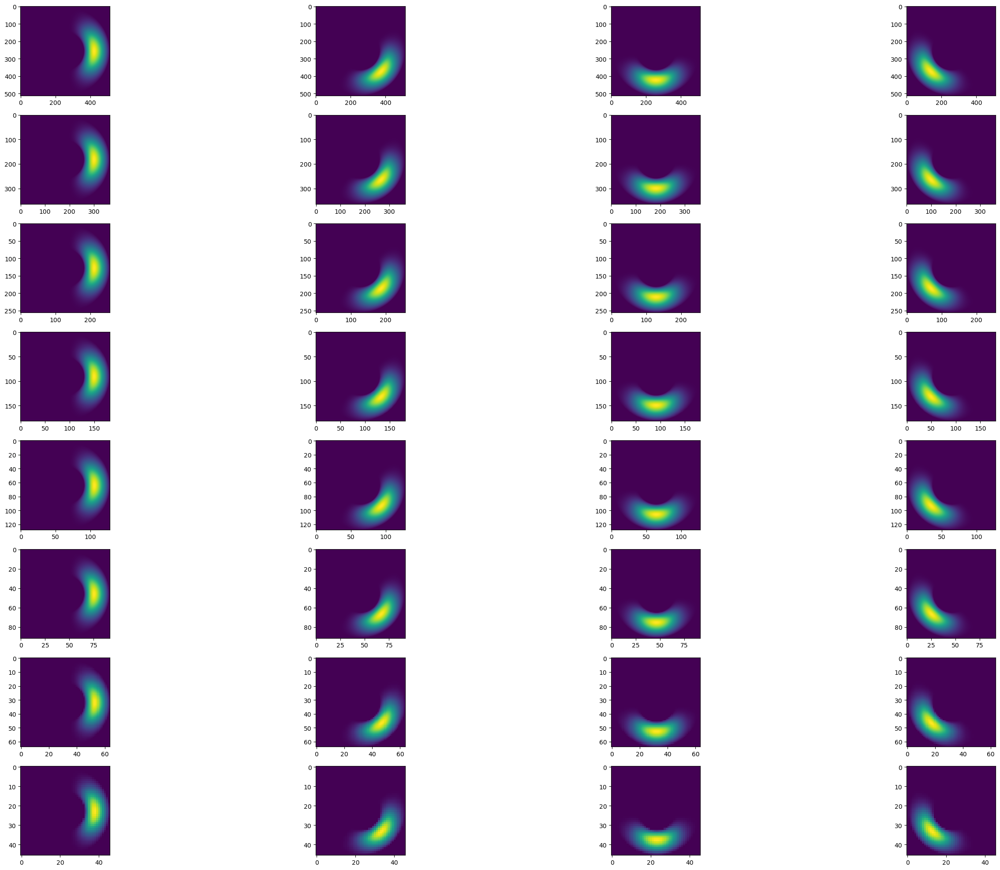

In [66]:
s_pyr.display(filters);

In [67]:
if s_pyr.complex_pyr:
    magnitude_pyramid = [np.abs(pyr) for pyr in pyramid]
    phase_pyramid = [np.angle(pyr) for pyr in pyramid]

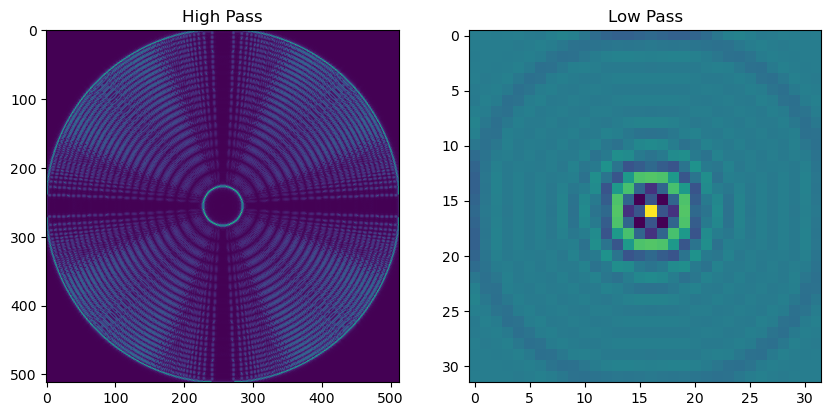

In [68]:
_, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(np.abs(pyramid[0]));
ax[0].set_title("High Pass");

ax[1].imshow(np.abs(pyramid[-1]));
ax[1].set_title("Low Pass");

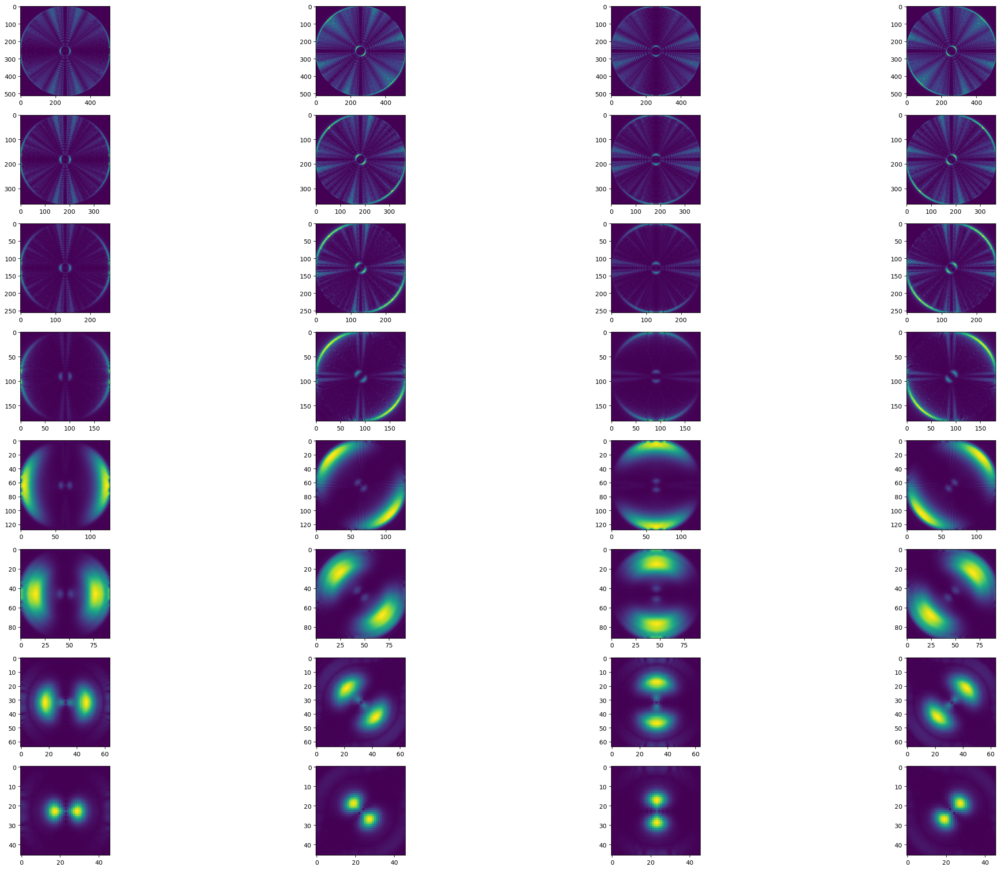

In [69]:
if s_pyr.complex_pyr:
    s_pyr.display(magnitude_pyramid);

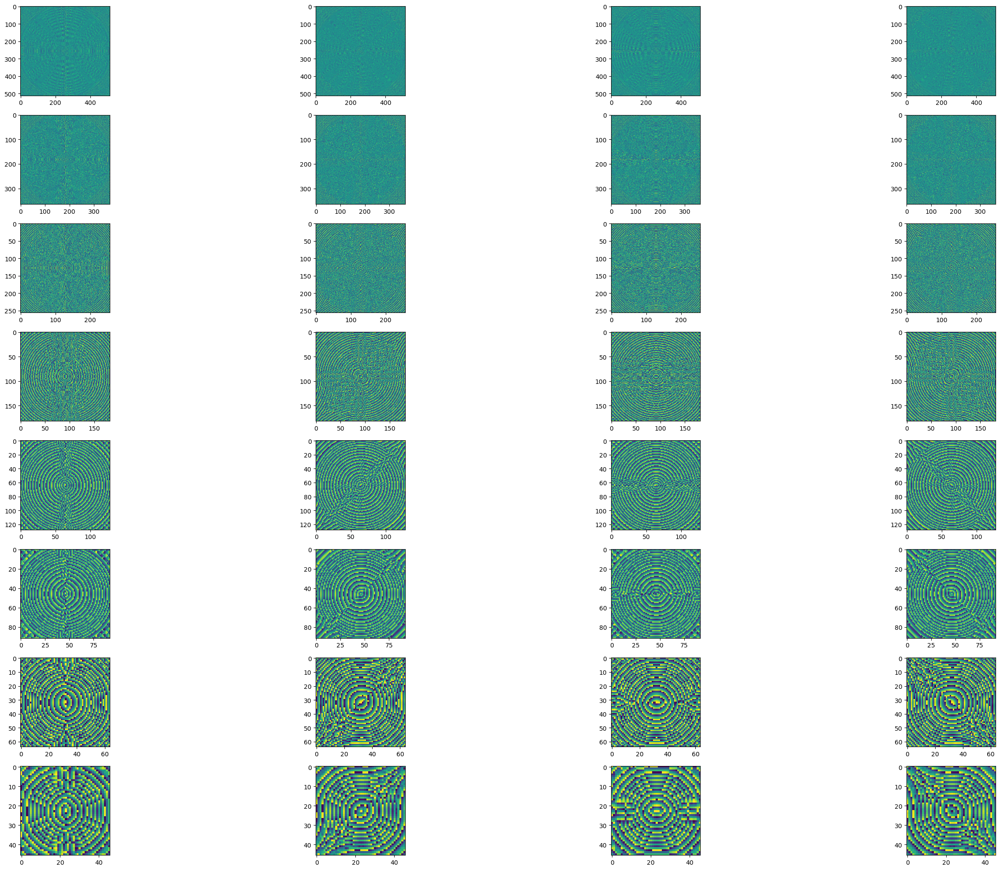

In [70]:
if s_pyr.complex_pyr:
    s_pyr.display(phase_pyramid);

In [71]:
if not s_pyr.complex_pyr:
    s_pyr.display(pyramid)

In [72]:
image_dft = np.fft.fftshift(np.fft.fft2(image))

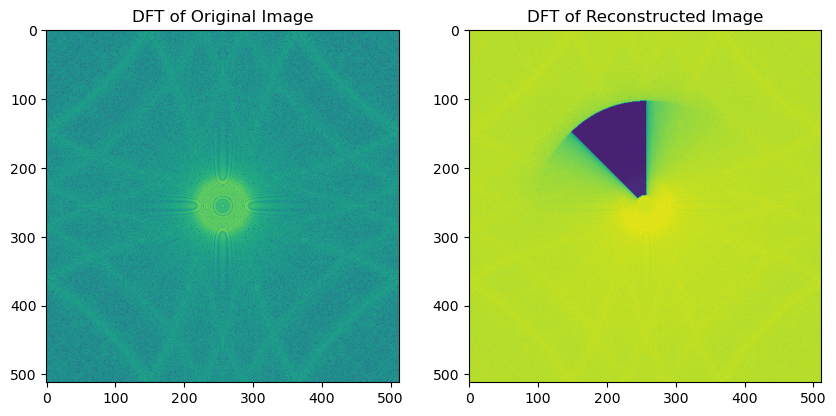

In [73]:
_, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(np.log(np.abs(image_dft)));
ax[0].set_title("DFT of Original Image");

ax[1].imshow(np.log(np.abs(recon_dft)));
ax[1].set_title("DFT of Reconstructed Image");

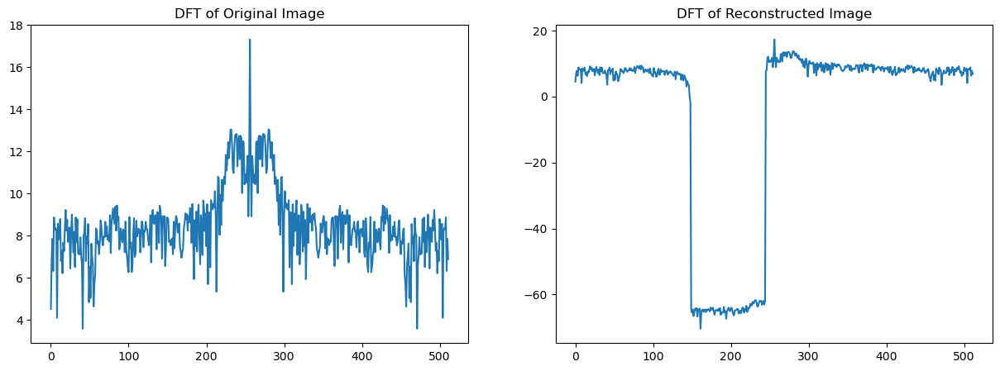

In [74]:
_, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].plot(np.log(np.abs( np.diag(image_dft) )));
ax[0].set_title("DFT of Original Image");

ax[1].plot(np.log(np.abs( np.diag(recon_dft) )));
ax[1].set_title("DFT of Reconstructed Image");

In [75]:
recon = np.fft.ifft2(np.fft.ifftshift(recon_dft)).real

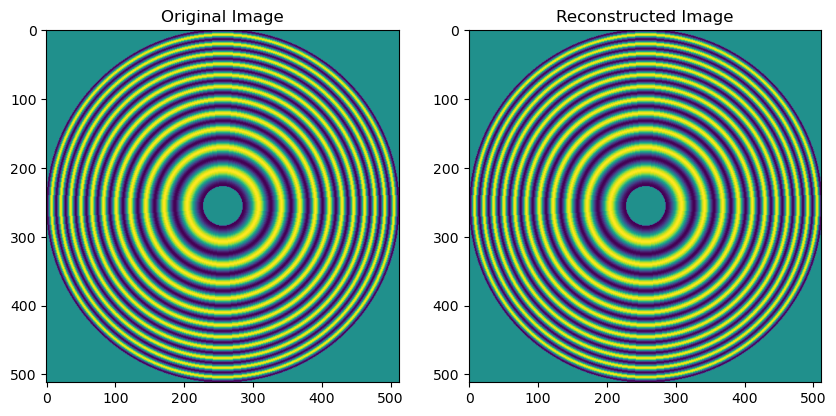

In [76]:
_, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(image);
ax[0].set_title("Original Image");

ax[1].imshow(recon);
ax[1].set_title("Reconstructed Image");

In [77]:
np.sum(np.abs(recon - image)), np.mean(np.square(recon - image))

(26199.536383330505, 0.015320350313074558)

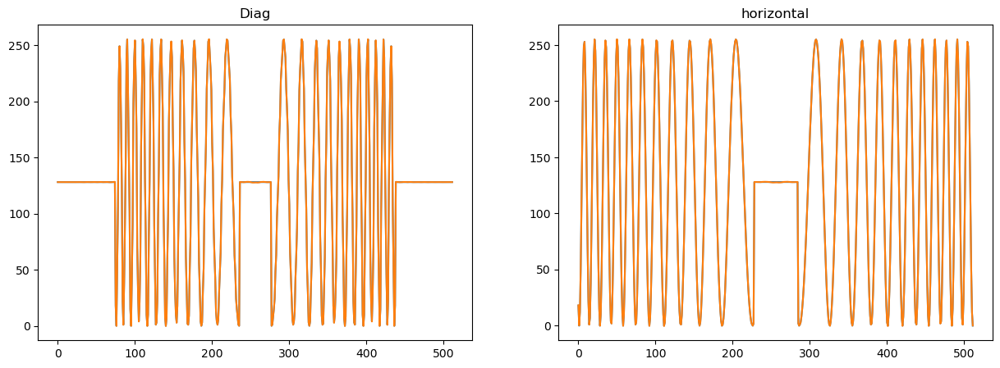

In [78]:
_, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].plot(np.diag(image));
ax[0].plot(np.diag(recon))
ax[0].set_title("Diag");

ax[1].plot(image[256, :]);
ax[1].plot(recon[256, :])
ax[1].set_title("horizontal");

### **Tutorial Images**

In [234]:
# s_pyr = SteerablePyramid(depth=4, orientations=4, filters_per_octave=1, twidth=1.0, complex_pyr=False) # for comparison
s_pyr = SteerablePyramid(depth=4, orientations=4, filters_per_octave=2, twidth=1.0, complex_pyr=False)

In [121]:
# get Steerable Pyramid Filters
filters, crops = s_pyr.get_filters(image, cropped=False) # SubOctive class only

# get Steerable Pyramid Decomposition
pyramid = s_pyr.build_pyramid_full(image, filters, crops)

# reconstruct original image DFT from pyramid decomposition
recon_dft = s_pyr.reconstruct_image_dft_full(pyramid, filters, crops)

In [122]:
radial_masks = []
for i in range(s_pyr.num_filts):
    idx = i*s_pyr.orientations
    _rad_masks = []
    for j in range(1, s_pyr.orientations + 1):
        jdx = idx + j
        _rad_masks.append(filters[jdx])

    radial_masks.append(np.dstack(_rad_masks).sum(axis=-1))

In [ ]:
# full octave

# radial_masks_full = []
# for i in range(s_pyr.num_filts):
#     idx = i*s_pyr.orientations
#     _rad_masks = []
#     for j in range(1, s_pyr.orientations + 1):
#         jdx = idx + j
#         _rad_masks.append(filters[jdx])

#     radial_masks_full.append(np.dstack(_rad_masks).sum(axis=-1))

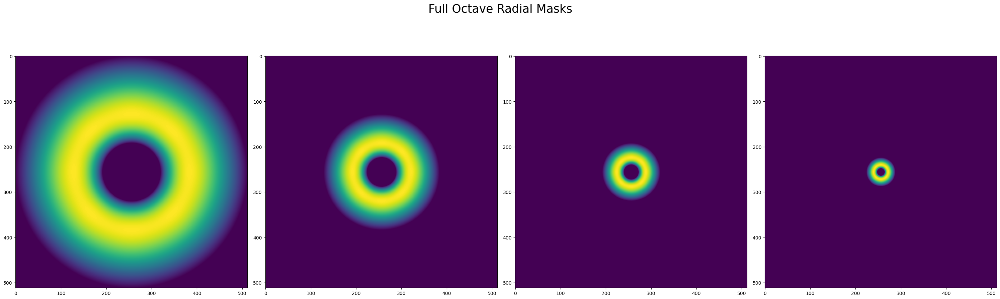

In [63]:
fig, ax = plt.subplots(1, len(radial_masks), figsize=(30, 10))
fig.suptitle("Full Octave Radial Masks", size=25)

for i in range(len(radial_masks)):
    ax[i].imshow(radial_masks_full[i]);


plt.tight_layout();

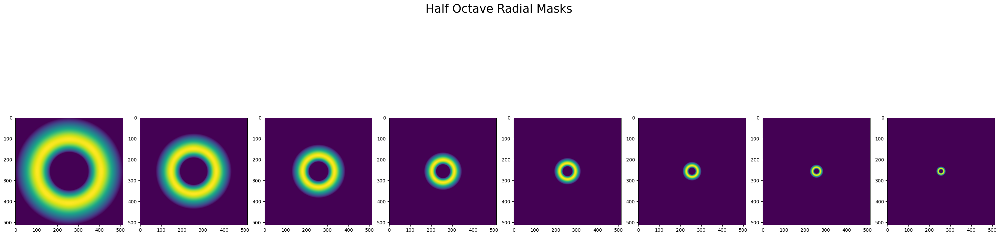

In [123]:
fig, ax = plt.subplots(1, len(radial_masks), figsize=(30, 10))
fig.suptitle("Half Octave Radial Masks", size=25)

for i in range(len(radial_masks)):
    ax[i].imshow(radial_masks[i]);


plt.tight_layout();

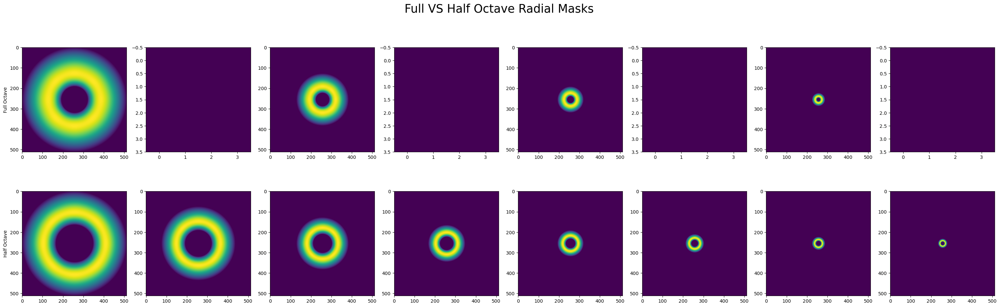

In [124]:
fig, ax = plt.subplots(2, len(radial_masks), figsize=(30, 10))
fig.suptitle("Full VS Half Octave Radial Masks", size=25)

for i in range(len(radial_masks_full)):
    ax[0, 2*i].imshow(radial_masks_full[i]);
    ax[0, 2*i - 1].imshow(np.zeros((4,4)));

for i in range(len(radial_masks)):
    ax[1, i].imshow(radial_masks[i]);

ax[0,0].set_ylabel("Full Octave")
ax[1,0].set_ylabel("Half Octave");

plt.tight_layout();

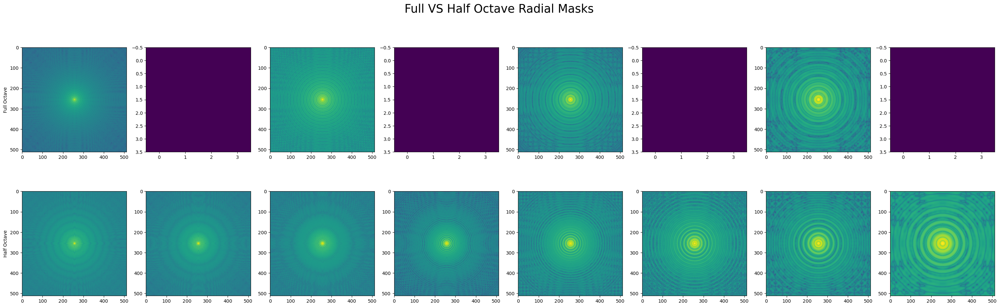

In [129]:
fig, ax = plt.subplots(2, len(radial_masks), figsize=(30, 10))
fig.suptitle("Full VS Half Octave Radial Masks", size=25)

for i in range(len(radial_masks_full)):
    ax[0, 2*i].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(radial_masks_full[i])))));
    ax[0, 2*i - 1].imshow(np.zeros((4,4)));

for i in range(len(radial_masks)):
    ax[1, i].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(radial_masks[i])))));

ax[0,0].set_ylabel("Full Octave")
ax[1,0].set_ylabel("Half Octave");

plt.tight_layout();

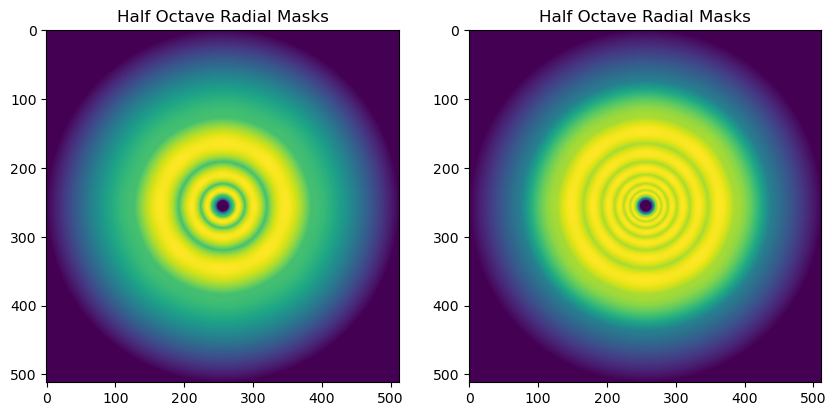

In [125]:
fig, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(np.dstack(radial_masks_full).sum(axis=-1))
ax[0].set_title("Half Octave Radial Masks");
ax[1].imshow(np.dstack(radial_masks).sum(axis=-1))
ax[1].set_title("Half Octave Radial Masks");

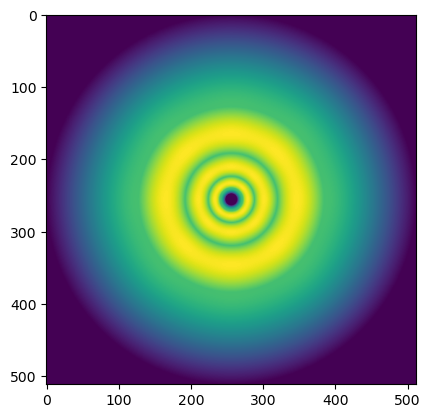

In [97]:
plt.imshow(np.dstack(radial_masks_full).sum(axis=-1));

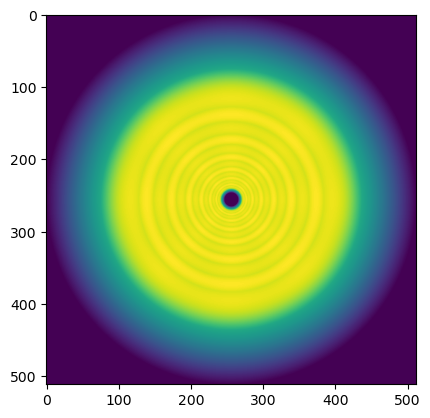

In [98]:
plt.imshow(np.dstack(radial_masks).sum(axis=-1));